In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from scipy import stats
import folium
import geopandas as gpd
from geopy.geocoders import Nominatim
from sklearn.cluster import DBSCAN 
import collections.abc
from collections.abc import MutableSequence 

# Plotting libraries
import plotly.express as px
from dash import Dash, dcc, html
from dash.dependencies import Input, Output, State
import matplotlib.cm as cm

In [2]:
data = pd.read_csv("Cleaned Data/Cleaned_Data.csv", index_col=0, parse_dates=['CRASH DATE'])
data['YEAR'] = data['CRASH DATE'].dt.year
data['MONTH'] = data['CRASH DATE'].dt.month

In [3]:
data_24 = data[data['YEAR'] == 2024]

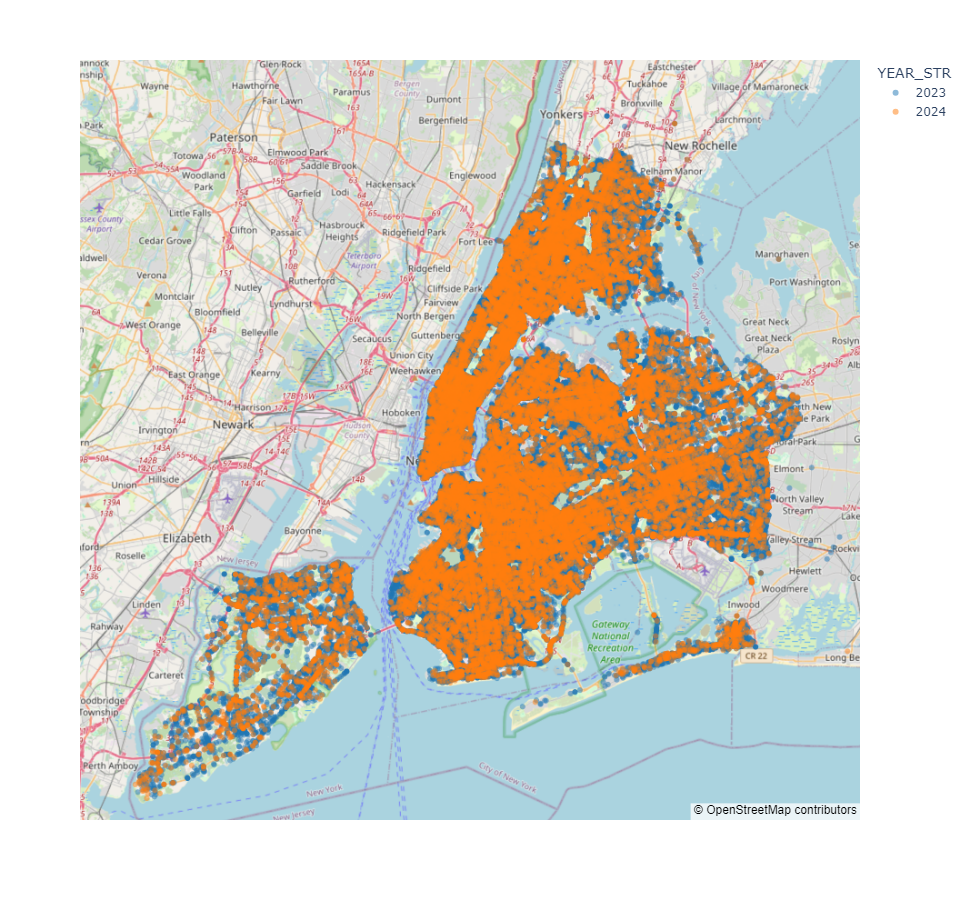

In [5]:
data['YEAR_STR'] = data['YEAR'].astype(str)
fig = px.scatter_mapbox(
    data[data['YEAR']>2022], 
    lat='LATITUDE',
    lon='LONGITUDE',
    mapbox_style='open-street-map',
    color='YEAR_STR',
    color_discrete_sequence=px.colors.qualitative.D3,
    zoom=2,
    opacity=0.5,
    center={'lat':40.68675, 'lon':-73.76553},
    width=800,
    height=900
)
fig.update_layout(mapbox_bounds={
    'west': -74.30,
    'east': -73.65,
    'south': 40.45,
    'north': 41.0
})
fig.show()

# Dash - year slider

In [6]:
# data['YEAR_STR'] = data['YEAR'].astype(str)
# app = Dash(__name__)
# app.layout = html.Div([
#     dcc.RangeSlider(min(data['YEAR']), 
#                     max(data['YEAR']), 
#                     step=None, 
#                     value=[2020, 2023], 
#                     id='my-range-slider',
#                     marks=dict([(int(i), str(i)) for i in data['YEAR'].unique()]),
#                     tooltip={"placement": "bottom", "always_visible": True}
#                    ),
#     dcc.Dropdown(id='dropdown-boro',
#                  options={
#                     'MANHATTAN': 'Manhattan',
#                     'BROOKLYN': 'Brooklyn',
#                     'QUEENS': 'Queens',
#                     'BRONX': 'Bronx',
#                     'STATEN ISLAND': 'Staten Island'
#                  },
#                  value='BROOKLYN',
#                  multi=True
#     ),
#     dcc.Dropdown(id='dropdown-accd',
#                  options={
#                     'NUMBER OF PERSONS INJURED': 'Persons Injured',
#                     'NUMBER OF PEDESTRIANS INJURED': 'Pedestrians Injured',
#                     'NUMBER OF MOTORIST INJURED': 'Motorists Injured',
#                     'NUMBER OF CYCLIST INJURED': 'Cyclists Injured',
#                     'NUMBER OF PERSONS KILLED': 'Persons Killed',
#                     'NUMBER OF PEDESTRIANS KILLED': 'Pedestrians Killed',
#                     'NUMBER OF MOTORIST KILLED': 'Motorists Killed',
#                     'NUMBER OF CYCLIST KILLED': 'Cyclists Killed'
#                  },
#                  value="NUMBER OF PEDESTRIANS INJURED",
#                  multi=False
#     ),
#     dcc.Graph(id='accident-scattered')
# ])

# # Updating value of the slider
# @app.callback(
#     Output('my-range-slider', 'value'),
#     Input('my-range-slider', 'value')
# )

# def update_slider_value_check(value):
#     if value[1] - value[0] > 2:
#         return[value[0], value[0]+2]
#     return value

# @app.callback(
#     Output('accident-scattered', 'figure'),
#     [Input('my-range-slider', 'value'),
#      Input('dropdown-boro', 'value'),
#      Input('dropdown-accd', 'value')
#     ]
# )

# def update_chart(year, boro, accd):
#     print(year, boro, accd)
#     # To allow us to use .isin
#     if isinstance(boro, str):
#         boro = [boro]
#     # If person, include 0 people
#     if 'PERSON' in str(accd):
#         df = data[((data['YEAR'] >= min(year)) & (data['YEAR'] <= max(year))) & (data['BOROUGH'].isin(boro))]
#     # Else exclude 0
#     else:
#         df = data[((data['YEAR'] >= min(year)) & (data['YEAR'] <= max(year))) & (data['BOROUGH'].isin(boro)) & (data[accd] > 0)]
  
#     fig = px.scatter_mapbox(
#         df, 
#         lat='LATITUDE',
#         lon='LONGITUDE',
#         mapbox_style='open-street-map',
#         color='YEAR_STR',
#         color_discrete_sequence=px.colors.qualitative.D3,
#         size = accd,
#         zoom=2,
#         opacity=0.5,
#         hover_name='BOROUGH',
#         hover_data=['YEAR', 'MONTH', accd],
#         center={'lat':40.68675, 'lon':-73.76553},
#         width=1000,
#         height=700
#     )
#     fig.update_layout(mapbox_bounds={
#         'west': -74.30,
#         'east': -73.65,
#         'south': 40.45,
#         'north': 41.0
#     })
    
#     return fig

# if __name__ == '__main__':
#     app.run(jupyter_mode='external', debug=True, use_reloader=False)

Dash app running on http://127.0.0.1:8050/
[2020, 2022] BROOKLYN NUMBER OF PEDESTRIANS INJURED
[2020, 2022] ['BROOKLYN', 'STATEN ISLAND'] NUMBER OF PEDESTRIANS INJURED
[2020, 2022] ['STATEN ISLAND'] NUMBER OF PEDESTRIANS INJURED
[2017, 2019] ['STATEN ISLAND'] NUMBER OF PEDESTRIANS INJURED
[2017, 2018] ['STATEN ISLAND'] NUMBER OF PEDESTRIANS INJURED
[2017, 2018] ['STATEN ISLAND'] NUMBER OF PEDESTRIANS KILLED
[2017, 2018] ['STATEN ISLAND'] NUMBER OF PEDESTRIANS INJURED
[2017, 2018] ['STATEN ISLAND', 'BROOKLYN'] NUMBER OF PEDESTRIANS INJURED


In [36]:
data['YEAR_STR'] = data['YEAR'].astype(str)
app = Dash(__name__)
app.layout = html.Div([
    dcc.RangeSlider(min(data['YEAR']), 
                    max(data['YEAR']), 
                    step=None, 
                    value=[2021, 2023], 
                    id='my-range-slider',
                    marks=dict([(int(i), str(i)) for i in data['YEAR'].unique()]),
                    tooltip={"placement": "bottom", "always_visible": True}
                   ),
    dcc.Dropdown(id='dropdown-boro',
                 options={
                    'MANHATTAN': 'Manhattan',
                    'BROOKLYN': 'Brooklyn',
                    'QUEENS': 'Queens',
                    'BRONX': 'Bronx',
                    'STATEN ISLAND': 'Staten Island'
                 },
                 value='BROOKLYN',
                 multi=True
    ),
    dcc.Dropdown(id='dropdown-accd',
                 options={
                    'NUMBER OF PERSONS INJURED': 'Persons Injured',
                    'NUMBER OF PEDESTRIANS INJURED': 'Pedestrians Injured',
                    'NUMBER OF MOTORIST INJURED': 'Motorists Injured',
                    'NUMBER OF CYCLIST INJURED': 'Cyclists Injured',
                    'NUMBER OF PERSONS KILLED': 'Persons Killed',
                    'NUMBER OF PEDESTRIANS KILLED': 'Pedestrians Killed',
                    'NUMBER OF MOTORIST KILLED': 'Motorists Killed',
                    'NUMBER OF CYCLIST KILLED': 'Cyclists Killed'
                 },
                 value="NUMBER OF PEDESTRIANS INJURED",
                 multi=False
    ),
    dcc.Graph(id='accident-scattered'),
    dcc.Graph(id='summary-bar-chart'),
])

# Updating value of the slider
@app.callback(
    Output('my-range-slider', 'value'),
    Input('my-range-slider', 'value')
)

def update_slider_value_check(value):
    if value[1] - value[0] > 2:
        return[value[0], value[0]+2]
    return value

@app.callback(
    Output('accident-scattered', 'figure'),
    [Input('my-range-slider', 'value'),
     Input('dropdown-boro', 'value'),
     Input('dropdown-accd', 'value')
    ]
)

def update_chart(year, boro, accd):
    print(year, boro, accd)
    # To allow us to use .isin
    if isinstance(boro, str):
        boro = [boro]
    # If person, include 0 people
    if 'PERSON' in str(accd):
        df = data[((data['YEAR'] >= min(year)) & (data['YEAR'] <= max(year))) & (data['BOROUGH'].isin(boro))]
    # Else exclude 0
    else:
        df = data[((data['YEAR'] >= min(year)) & (data['YEAR'] <= max(year))) & (data['BOROUGH'].isin(boro)) & (data[accd] > 0)]
  
    fig = px.scatter_mapbox(
        df, 
        lat='LATITUDE',
        lon='LONGITUDE',
        mapbox_style='open-street-map',
        color='YEAR_STR',
        color_discrete_sequence=px.colors.qualitative.D3,
        size = accd,
        zoom=2,
        opacity=0.5,
        hover_name='BOROUGH',
        hover_data=['YEAR', 'MONTH', accd],
        center={'lat':40.68675, 'lon':-73.76553},
        width=1000,
        height=700
    )
    fig.update_layout(mapbox_bounds={
        'west': -74.30,
        'east': -73.65,
        'south': 40.45,
        'north': 41.0
    })
    fig.update_layout(dragmode='lasso')
    return fig

@app.callback(
    Output('summary-bar-chart', 'figure'),
    [Input('accident-scattered', 'selectedData'),
     Input('dropdown-accd', 'value'),
     Input('my-range-slider', 'value')]
)

def update_summary_bar(selectedData, accd, year_range):
    if selectedData and 'points' in selectedData:
        indices = [pt['pointIndex'] for pt in selectedData['points']]
        selected_df = data.iloc[indices]
        # Filter the selected data based on the slider range
        selected_df = selected_df[(selected_df['YEAR'] >= year_range[0]) & (selected_df['YEAR'] <= year_range[1])]
        
        # Ensure all years within the range are included in the DataFrame
        years_within_range = range(year_range[0], year_range[1] + 1)
        grouped = selected_df.groupby('YEAR')[accd].agg(['sum', 'count']).reindex(years_within_range).reset_index()

        fig = px.bar(
            grouped, 
            x='YEAR', 
            y='sum', 
            text='sum',
            title=f'Sum of {accd} by Year',
            color_discrete_map={
                min(year_range): '#1f77b4',
                min(year_range)+1: '#ff7f0e',
                min(year_range)+2: '#2ca02c'
            }
        )
        
        fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
        fig.update_layout(yaxis_title=accd, barmode='group')
        return fig
    else:
        # Return an empty figure if no data is selected
        return px.bar(title=f'Select data to see sum of {accd} by Year')


if __name__ == '__main__':
    app.run(jupyter_mode='external', debug=True, use_reloader=False)

Dash app running on http://127.0.0.1:8050/
[2021, 2023] BROOKLYN NUMBER OF PEDESTRIANS INJURED
[2021, 2023] BROOKLYN NUMBER OF PEDESTRIANS INJURED
[2021, 2023] BROOKLYN NUMBER OF PEDESTRIANS INJURED
[2021, 2023] BROOKLYN NUMBER OF PEDESTRIANS INJURED
[2021, 2023] ['BROOKLYN', 'MANHATTAN'] NUMBER OF PEDESTRIANS INJURED
[2021, 2023] ['BROOKLYN'] NUMBER OF PEDESTRIANS INJURED
[2021, 2023] ['BROOKLYN', 'MANHATTAN'] NUMBER OF PEDESTRIANS INJURED
[2021, 2023] ['BROOKLYN', 'MANHATTAN'] NUMBER OF CYCLIST INJURED


## working code
app = Dash(__name__)
app.layout = html.Div([
    dcc.RangeSlider(min(data['YEAR']), 
                    max(data['YEAR']), 
                    step=None, 
                    value=[2020, 2023], 
                    id='my-range-slider',
                    allowCross=False,
                    marks=dict([(int(i), str(i)) for i in data['YEAR'].unique()]),
                    tooltip={"placement": "bottom", "always_visible": True}
                   ),
    dcc.Dropdown(id='dropdown-boro',
                 options={
                    'MANHATTAN': 'Manhattan',
                    'BROOKLYN': 'Brooklyn',
                    'QUEENS': 'Queens',
                    'BRONX': 'Bronx',
                    'STATEN ISLAND': 'Staten Island'
                 },
                 value='BROOKLYN',
                 multi=True
    ),
    dcc.Dropdown(id='dropdown-accd',
                 options={
                    'NUMBER OF PERSONS INJURED': 'Persons Injured',
                    'NUMBER OF PEDESTRIANS INJURED': 'Pedestrians Injured',
                    'NUMBER OF MOTORIST INJURED': 'Motorists Injured',
                    'NUMBER OF CYCLIST INJURED': 'Cyclists Injured',
                    'NUMBER OF PERSONS KILLED': 'Persons Killed',
                    'NUMBER OF PEDESTRIANS KILLED': 'Pedestrians Killed',
                    'NUMBER OF MOTORIST KILLED': 'Motorists Killed',
                    'NUMBER OF CYCLIST KILLED': 'Cyclists Killed'
                 },
                 value="NUMBER OF PEDESTRIANS INJURED",
                 multi=False
    ),
    html.Div(id='range-slider')
])

# Updating value of the slider
@app.callback(
    Output('my-range-slider', 'value'),
    Input('my-range-slider', 'value')
)

def update_slider_value_check(value):
    if value[1] - value[0] > 2:
        return[value[0], value[0]+2]
    return value

@app.callback(
    Output('range-slider', 'children'),
    [Input('my-range-slider', 'value'),
     Input('dropdown-boro', 'value'),
     Input('dropdown-accd', 'value')
    ]
)

def update_output(year, boro, accd):
    print(year, boro, accd)
    # To allow us to use .isin
    if isinstance(boro, str):
        boro = [boro]
    print("min year", min(year), "max year", max(year), "boros = ", True if 'MANHATTAN' in boro else False, " accd: ", sum(data[accd]))
    if 'PERSON' in str(accd):
        print(data[((data['YEAR'] >= min(year)) & (data['YEAR'] <= max(year))) & (data['BOROUGH'].isin(boro))].shape[0])
    else:
        print(data[((data['YEAR'] >= min(year)) & (data['YEAR'] <= max(year))) & (data['BOROUGH'].isin(boro)) & (data[accd] > 0)].shape)
    return 'You have selected "{}", for boroughs "{}" and accident type "{}"'.format(year, boro, accd)
    

if __name__ == '__main__':
    app.run(jupyter_mode='external', debug=True)